In [1]:
import os
import random
import torch
import torch.nn as nn
import torch.nn.parallel
import torch.backends.cudnn as cudnn
import torch.optim as optim
import torch.utils.data
import torchvision.datasets as dset
import torchvision.transforms as transforms
import torchvision.utils as vutils
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML

from parameters import *
from dataloader_style import *
from model_style import * 

In [2]:
# Set random seed for reproducibility
manualSeed = 999
#manualSeed = random.randint(1, 10000) # use if you want new results
print("Random Seed: ", manualSeed)
random.seed(manualSeed)
torch.manual_seed(manualSeed)

# Create the dataloader
dataset = StyleDataset()
dataloader = DataLoader(dataset, batch_size, shuffle=True, num_workers=workers, pin_memory=True)

# Dataloader usage in training loop: 
# for i, (data, target, label) in enumerate(dataloader): data=image, target=onehot encoded style, label=style

# Decide which device we want to run on
device = torch.device("cuda:0" if (torch.cuda.is_available() and ngpu > 0) else "cpu")

Random Seed:  999


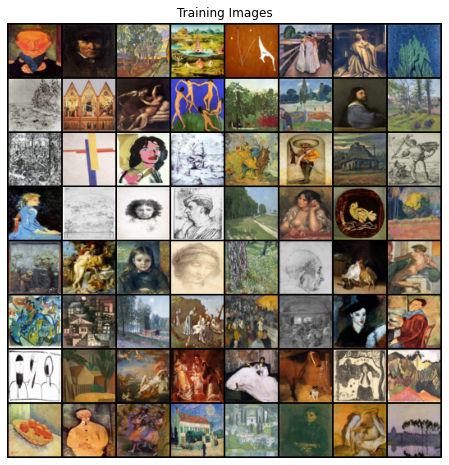

In [3]:
# Plot some training images
real_batch = next(iter(dataloader))
plt.figure(figsize=(8,8))
plt.axis("off")
plt.title("Training Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:64], padding=2, normalize=True).cpu(),(1,2,0)))

In [4]:
# Create the generator
netG = Generator(ngpu).to(device)

# # Handle multi-gpu if desired
# if (device.type == 'cuda') and (ngpu > 1):
#     netG = nn.DataParallel(netG, list(range(ngpu)))

# Apply the weights_init function to randomly initialize all weights
#  to mean=0, stdev=0.2.
netG.apply(weights_init)

# Print the model
print(netG)

Generator(
  (main): Sequential(
    (0): ConvTranspose2d(150, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace=True)
    (9): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): ReLU(inplace=True)
    (12): ConvTranspose2d(64, 3, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (13): Tanh()
  )
)


In [5]:
# Create the Discriminator
netD = Discriminator(ngpu).to(device)

# # Handle multi-gpu if desired
# if (device.type == 'cuda') and (ngpu > 1):
#     netD = nn.DataParallel(netD, list(range(ngpu)))

# Apply the weights_init function to randomly initialize all weights
#  to mean=0, stdev=0.2.
netD.apply(weights_init)

# Print the model
print(netD)

Discriminator(
  (main): Sequential(
    (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (4): LeakyReLU(negative_slope=0.2, inplace=True)
    (5): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (6): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): LeakyReLU(negative_slope=0.2, inplace=True)
    (8): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (9): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): LeakyReLU(negative_slope=0.2, inplace=True)
    (11): Conv2d(512, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (12): BatchNorm2d(512, eps=1e-05, momentum=0.1, af

In [6]:
# Initialize BCELoss function
criterion = nn.BCELoss()
criterion_style = nn.CrossEntropyLoss()

# Create batch of latent vectors that we will use to visualize
#  the progression of the generator
fixed_noise = torch.randn(64, nz, 1, 1, device=device)

# Establish convention for real and fake labels during training
real_label = 1.
fake_label = 0.

# Setup Adam optimizers for both G and D
optimizerD = optim.Adam(netD.parameters(), lr=lr, betas=(beta1, 0.999))
optimizerG = optim.Adam(netG.parameters(), lr=lr, betas=(beta1, 0.999))

In [ ]:
# Training Loop

# Lists to keep track of progress
img_list = []
G_losses = []
D_losses = []
iters = 0

print("Starting Training Loop...")
# For each epoch
for epoch in range(num_epochs):
    # For each batch in the dataloader
    for i, (data, target, style_label) in enumerate(dataloader, 0):

        ############################
        # (1) Update D network: maximize log(D(x)) + log(1 - D(G(z)))
        ###########################
        ## Train with all-real batch
        netD.zero_grad()
        # Format batch
        target = target.to(device)
        style_label = style_label.to(device)
        real_cpu = data.to(device)
        b_size = real_cpu.size(0)
        label = torch.full((b_size,), real_label, dtype=torch.float, device=device)
        # Forward pass real batch through D
        output, output_style = netD(real_cpu)
        # Calculate loss on all-real batch
        errD_real = criterion(output, label)
        errD_real = errD_real + criterion_style(output_style.squeeze(), style_label.squeeze())
        # Calculate gradients for D in backward pass
        errD_real.backward()
        D_x = output.mean().item()

        ## Train with all-fake batch
        # Generate batch of latent vectors
        noise = torch.randn(b_size, nz, 1, 1, device=device)
        # Generate fake image batch with G
        fake = netG(noise)
        label.fill_(fake_label)
        # Classify all fake batch with D
        output, output_style = netD(fake.detach())
        # Uniform cross entropy
        logsoftmax = nn.LogSoftmax(dim=1)
        unif = torch.full((data.shape[0], n_class), 1/n_class)
        unif = unif.to(device)
        # Calculate D's loss on the all-fake batch
        errD_fake = criterion(output, label)
        errD_fake = errD_fake + torch.mean(-torch.sum(unif * logsoftmax(output_style), 1))
        # Calculate the gradients for this batch
        errD_fake.backward()
        D_G_z1 = output.mean().item()
        # Add the gradients from the all-real and all-fake batches
        errD = errD_real + errD_fake
        # Update D
        optimizerD.step()

        ############################
        # (2) Update G network: maximize log(D(G(z)))
        ###########################
        netG.zero_grad()
        label.fill_(real_label)  # fake labels are real for generator cost
        # Since we just updated D, perform another forward pass of all-fake batch through D
        output, output_style = netD(fake)
        # Calculate G's loss based on this output
        errG = criterion(output, label)
        # Calculate gradients for G
        errG.backward()
        D_G_z2 = output.mean().item()
        # Update G
        optimizerG.step()

        # Output training stats
        if i % 50 == 0:
            print('[%d/%d][%d/%d]\tLoss_D: %.4f\tLoss_G: %.4f\tD(x): %.4f\tD(G(z)): %.4f / %.4f'
                  % (epoch, num_epochs, i, len(dataloader),
                     errD.item(), errG.item(), D_x, D_G_z1, D_G_z2))

        # Save Losses for plotting later
        G_losses.append(errG.item())
        D_losses.append(errD.item())

        # Check how the generator is doing by saving G's output on fixed_noise
        if (iters % 500 == 0) or ((epoch == num_epochs-1) and (i == len(dataloader)-1)):
            with torch.no_grad():
                fake = netG(fixed_noise).detach().cpu()
            img_list.append(vutils.make_grid(fake, padding=2, normalize=True))

        iters += 1

Starting Training Loop...
[0/150][0/68]	Loss_D: 6.1831	Loss_G: 0.8763	D(x): 0.6171	D(G(z)): 0.4352 / 0.4231
[0/150][50/68]	Loss_D: 5.9202	Loss_G: 1.1823	D(x): 0.6781	D(G(z)): 0.3409 / 0.3227
[1/150][0/68]	Loss_D: 5.6703	Loss_G: 1.4369	D(x): 0.6875	D(G(z)): 0.2559 / 0.2484
[1/150][50/68]	Loss_D: 5.9977	Loss_G: 0.9890	D(x): 0.6539	D(G(z)): 0.3893 / 0.3913
[2/150][0/68]	Loss_D: 6.2112	Loss_G: 0.9714	D(x): 0.6017	D(G(z)): 0.3434 / 0.3952
[2/150][50/68]	Loss_D: 6.5410	Loss_G: 0.9688	D(x): 0.5352	D(G(z)): 0.4055 / 0.4124
[3/150][0/68]	Loss_D: 6.6233	Loss_G: 0.9790	D(x): 0.5395	D(G(z)): 0.4630 / 0.3828
[3/150][50/68]	Loss_D: 6.2724	Loss_G: 1.0507	D(x): 0.6477	D(G(z)): 0.5210 / 0.3697
[4/150][0/68]	Loss_D: 6.3220	Loss_G: 0.9549	D(x): 0.5810	D(G(z)): 0.4139 / 0.4043
[4/150][50/68]	Loss_D: 6.5227	Loss_G: 1.1614	D(x): 0.5426	D(G(z)): 0.4450 / 0.3307
[5/150][0/68]	Loss_D: 6.3803	Loss_G: 0.9532	D(x): 0.5293	D(G(z)): 0.4071 / 0.3943
[5/150][50/68]	Loss_D: 6.4323	Loss_G: 1.0628	D(x): 0.5313	D(G(z)): 

[49/150][50/68]	Loss_D: 3.4024	Loss_G: 2.7860	D(x): 0.8549	D(G(z)): 0.1505 / 0.0815
[50/150][0/68]	Loss_D: 3.9615	Loss_G: 2.4991	D(x): 0.8066	D(G(z)): 0.3245 / 0.1218
[50/150][50/68]	Loss_D: 3.8847	Loss_G: 2.8923	D(x): 0.8535	D(G(z)): 0.3555 / 0.0701
[51/150][0/68]	Loss_D: 3.8550	Loss_G: 2.5353	D(x): 0.7511	D(G(z)): 0.1984 / 0.1389
[51/150][50/68]	Loss_D: 4.1279	Loss_G: 1.8045	D(x): 0.6490	D(G(z)): 0.2356 / 0.2175
[52/150][0/68]	Loss_D: 3.6071	Loss_G: 3.1488	D(x): 0.8883	D(G(z)): 0.2502 / 0.0616
[52/150][50/68]	Loss_D: 3.7672	Loss_G: 2.6248	D(x): 0.7369	D(G(z)): 0.1765 / 0.1058
[53/150][0/68]	Loss_D: 3.5397	Loss_G: 3.3350	D(x): 0.9114	D(G(z)): 0.2211 / 0.0569
[53/150][50/68]	Loss_D: 3.8260	Loss_G: 2.2258	D(x): 0.7188	D(G(z)): 0.1815 / 0.1380
[54/150][0/68]	Loss_D: 3.6868	Loss_G: 3.5770	D(x): 0.9490	D(G(z)): 0.3093 / 0.0530
[54/150][50/68]	Loss_D: 3.3802	Loss_G: 2.7577	D(x): 0.8960	D(G(z)): 0.1686 / 0.0851
[55/150][0/68]	Loss_D: 3.4594	Loss_G: 2.8619	D(x): 0.8424	D(G(z)): 0.1286 / 0.090

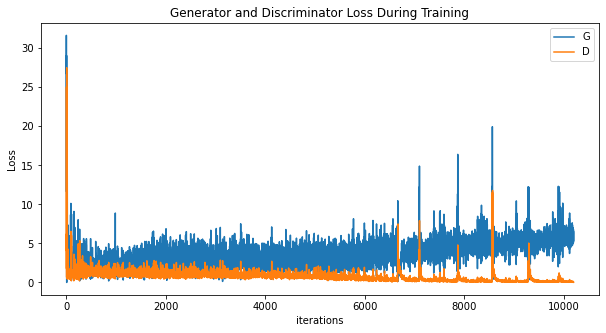

In [8]:
# Plot Losses
plt.figure(figsize=(10,5))
plt.title("Generator and Discriminator Loss During Training")
plt.plot(G_losses,label="G")
plt.plot(D_losses,label="D")
plt.xlabel("iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()

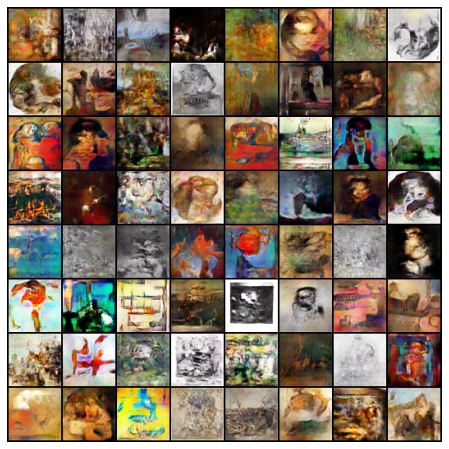

In [9]:
# Visualize G's Progress
fig = plt.figure(figsize=(8,8))
plt.axis("off")
ims = [[plt.imshow(np.transpose(i,(1,2,0)), animated=True)] for i in img_list]
ani = animation.ArtistAnimation(fig, ims, interval=1000, repeat_delay=1000, blit=True)

HTML(ani.to_jshtml())

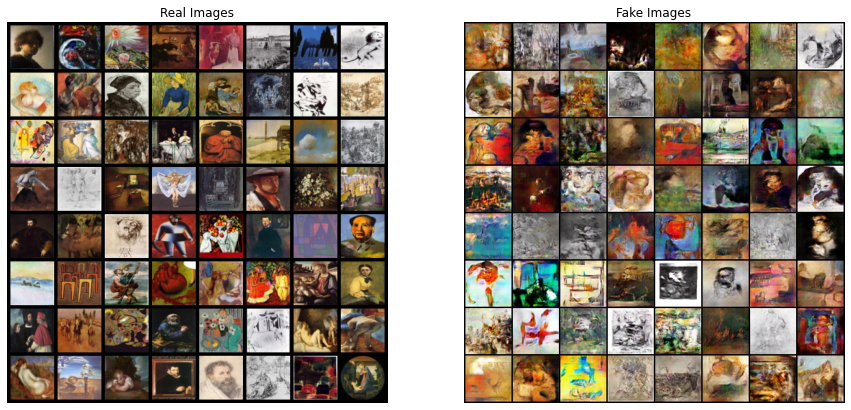

In [10]:
# Real vs Fake
# Grab a batch of real images from the dataloader
real_batch = next(iter(dataloader))

# Plot the real images
plt.figure(figsize=(15,15))
plt.subplot(1,2,1)
plt.axis("off")
plt.title("Real Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:64], padding=5, normalize=True).cpu(),(1,2,0)))

# Plot the fake images from the last epoch
plt.subplot(1,2,2)
plt.axis("off")
plt.title("Fake Images")
plt.imshow(np.transpose(img_list[-1],(1,2,0)))
plt.show()